<a href="https://colab.research.google.com/github/irislqy/customer_churn/blob/master/Telco_Customer_Churn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Telco Customer Churn

**This IBM Sample Dataset has information about telecommunication customers. This project analyzes the attributes of the customers and contract types. The goal is to utilize the classification model to predict the churn rate. **

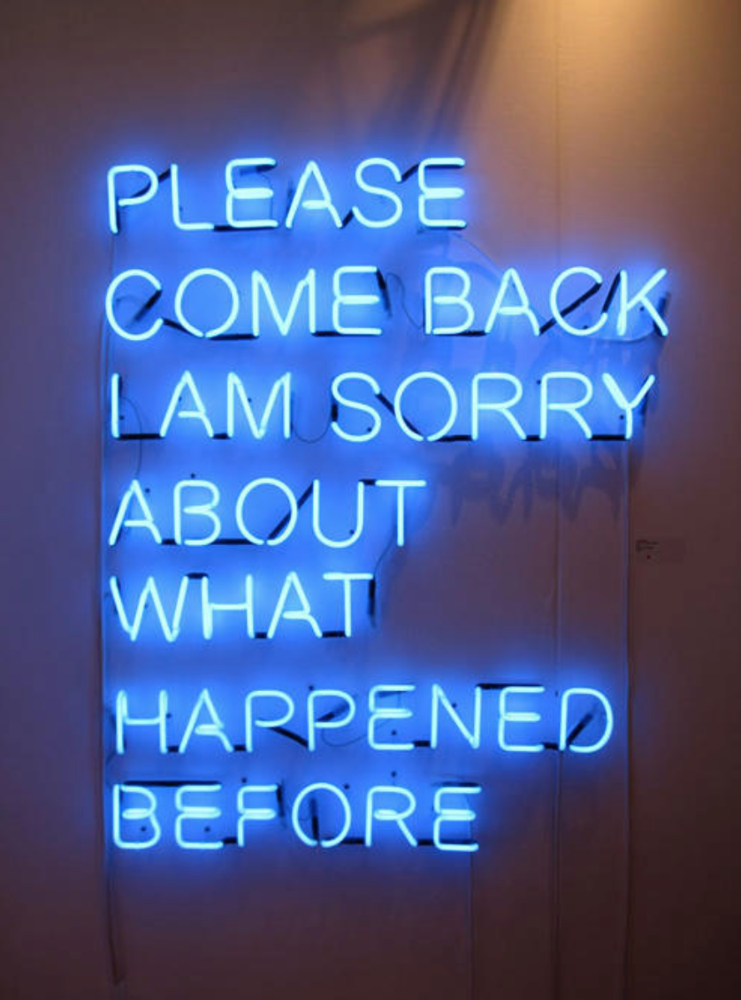

In [0]:
from IPython.display import Image
Image("1.png",width = 400)


## Ingest

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt #visualization
import plotly.plotly as py
import seaborn as sns #visualization
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import warnings
warnings.filterwarnings('ignore')
from collections import OrderedDict


In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# Read in the dataset
df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/Telco-Customer-Churn.csv")
churn = df.transpose()
churn


,0,1,2,3,4,5,6,7,8,9,...,7033,7034,7035,7036,7037,7038,7039,7040,7041,7042
customerID,7590-VHVEG,5575-GNVDE,3668-QPYBK,7795-CFOCW,9237-HQITU,9305-CDSKC,1452-KIOVK,6713-OKOMC,7892-POOKP,6388-TABGU,...,9767-FFLEM,0639-TSIQW,8456-QDAVC,7750-EYXWZ,2569-WGERO,6840-RESVB,2234-XADUH,4801-JZAZL,8361-LTMKD,3186-AJIEK
gender,Female,Male,Male,Male,Female,Female,Male,Female,Female,Male,...,Male,Female,Male,Female,Female,Male,Female,Female,Male,Male
SeniorCitizen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Partner,Yes,No,No,No,No,No,No,No,Yes,No,...,No,No,No,No,No,Yes,Yes,Yes,Yes,No
Dependents,No,No,No,No,No,No,Yes,No,No,Yes,...,No,No,No,No,No,Yes,Yes,Yes,No,No
tenure,1,34,2,45,2,8,22,10,28,62,...,38,67,19,12,72,24,72,11,4,66
PhoneService,No,Yes,Yes,No,Yes,Yes,Yes,No,Yes,Yes,...,Yes,Yes,Yes,No,Yes,Yes,Yes,No,Yes,Yes
MultipleLines,No phone service,No,No,No phone service,No,Yes,Yes,No phone service,Yes,No,...,No,Yes,No,No phone service,No,Yes,Yes,No phone service,Yes,No
InternetService,DSL,DSL,DSL,DSL,Fiber optic,Fiber optic,Fiber optic,DSL,Fiber optic,DSL,...,Fiber optic,Fiber optic,Fiber optic,DSL,No,DSL,Fiber optic,DSL,Fiber optic,Fiber optic
OnlineSecurity,No,Yes,Yes,Yes,No,No,No,Yes,No,Yes,...,No,Yes,No,No,No internet service,Yes,No,Yes,No,Yes


#### Missing Value Check

In [0]:
df.info() #no missing value

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
customerID          7043 non-null object
gender              7043 non-null object
SeniorCitizen       7043 non-null int64
Partner             7043 non-null object
Dependents          7043 non-null object
tenure              7043 non-null int64
PhoneService        7043 non-null object
MultipleLines       7043 non-null object
InternetService     7043 non-null object
OnlineSecurity      7043 non-null object
OnlineBackup        7043 non-null object
DeviceProtection    7043 non-null object
TechSupport         7043 non-null object
StreamingTV         7043 non-null object
StreamingMovies     7043 non-null object
Contract            7043 non-null object
PaperlessBilling    7043 non-null object
PaymentMethod       7043 non-null object
MonthlyCharges      7043 non-null float64
TotalCharges        7043 non-null object
Churn               7043 non-null object
dtypes: float64(1), int64(2), obj

##EDA

###Bar Chart

####data preprocess

In [0]:
sns.__version__


'0.7.1'

In [0]:
#g = sns.factorplot("Churn", data=df, aspect=1, kind="count", saturation=.5, palette="Blues_d")

#plt.title('Distribution of Churn and Non-Churn: Unbalanced Data', fontsize=14)

In [0]:
#init_notebook_mode(connected=True)
#import plotly.plotly as py
#import plotly.tools as tls
#from plotly.graph_objs import *
#py.sign_in("qylin", "Abe7u1ofTPxlfvI70Leb")

In [0]:
import IPython
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

def configure_plotly_browser_state():
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

configure_plotly_browser_state()
init_notebook_mode(connected=False)
#labels
lab = df["Churn"].value_counts().keys().tolist()
#values
val = df["Churn"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'salmon' ,'yellow'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer Attrition Telco: Unbalanced Data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)


####plot

In [0]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
iplot(fig)

###Plotly: Histogram

Idea: 

#####install plotly

In [0]:
import IPython
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot

def configure_plotly_browser_state():
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
        </script>
        '''))

configure_plotly_browser_state()
init_notebook_mode(connected=False)

#Separating churn and non churn customers
churn     = df[df["Churn"] == "Yes"]
not_churn = df[df["Churn"] == "No"]

#function  for histogram for customer attrition types
def histogram(column) :
    trace1 = go.Histogram(x  = churn[column],
                          histnorm= "percent",
                          name = "Churn Customers",
                          marker = dict(line = dict(width = .5,
                                                    color = "black"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
    trace2 = go.Histogram(x  = not_churn[column],
                          histnorm = "percent",
                          name = "Non churn customers",
                          marker = dict(line = dict(width = .5,
                                              color = "black"
                                             )
                                 ),
                          opacity = .9
                         )
    
    data = [trace1,trace2]
    layout = go.Layout(dict(title =column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                      )
    fig  = go.Figure(data=data,layout=layout)
    
    iplot(fig)

#####Histogram

In [0]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
histogram('MonthlyCharges')


In [0]:
#configure_plotly_browser_state()
#init_notebook_mode(connected=False)
#histogram('TotalCharges')

###KDE: Kernel Density Estimation
**https://jakevdp.github.io/PythonDataScienceHandbook/05.13-kernel-density-estimation.html

**color set: https://python-graph-gallery.com/100-calling-a-color-with-seaborn/

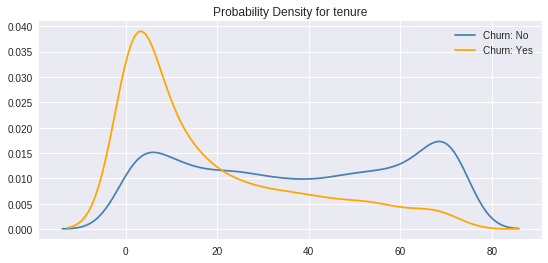

In [0]:
def kdeplot(feature):
    plt.figure(figsize=(9, 4))
    plt.title("Probability Density for {}".format(feature))
    ax0 = sns.kdeplot(df[df['Churn'] == 'No'][feature].dropna(), color= 'steelblue', label= 'Churn: No')
    ax1 = sns.kdeplot(df[df['Churn'] == 'Yes'][feature].dropna(), color= 'orange', label= 'Churn: Yes')
kdeplot('tenure')


###Plotly: Radar Chart

#####install plotly

In [0]:
## retrieve the categorical column
categorical_column = df1.nunique()[df1.nunique() == 2].keys()
categorical = df1[categorical_column]

#plotting radar chart for churn and non churn customers(binary variables)
def plot_radar(df1,aggregate,title) :
    data_frame = df1[df1["Churn"] == aggregate] 
    data_frame_x = data_frame[categorical_column].sum().reset_index()
    data_frame_x.columns  = ["feature","yes"]
    data_frame_x["no"]    = data_frame.shape[0]  - data_frame_x["yes"]
    data_frame_x  = data_frame_x[data_frame_x["feature"] != "Churn"]
    
    #count of 1's(yes)
    trace1 = go.Scatterpolar(r = data_frame_x["yes"].values.tolist(),
                             theta = data_frame_x["feature"].tolist(),
                             fill  = "toself",name = "count of 1's",
                             mode = "markers+lines",
                             marker = dict(size = 5)
                            )
    #count of 0's(No)
    trace2 = go.Scatterpolar(r = data_frame_x["no"].values.tolist(),
                             theta = data_frame_x["feature"].tolist(),
                             fill  = "toself",name = "count of 0's",
                             mode = "markers+lines",
                             marker = dict(size = 5)
                            ) 
    layout = go.Layout(dict(polar = dict(radialaxis = dict(visible = True,
                                                           side = "counterclockwise",
                                                           showline = True,
                                                           linewidth = 2,
                                                           tickwidth = 2,
                                                           gridcolor = "white",
                                                           gridwidth = 2),
                                         angularaxis = dict(tickfont = dict(size = 10),
                                                            layer = "below traces"
                                                           ),
                                         bgcolor  = "rgb(243,243,243)",
                                        ),
                            paper_bgcolor = "rgb(243,243,243)",
                            title = title,height = 700))
    
    data = [trace2,trace1]
    fig = go.Figure(data=data,layout=layout)
    iplot(fig)



#####plot

In [0]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)
#plot
plot_radar(categorical,1,"Churn -  Customers")

##Data Preprocessing

The dataset has 16 categorical columns and six of them have binary values (yes or no). The approach used here is:

In binary columns, just replace values with 1 and 0
Create a new column for each value in the remaining columns (and assign 1 or 0)
This is equivalent to one-hot-encode, but we avoid some extra columns for yes and no features.

**Since our dataset has some imbalance, we need a more reliable metric than accuracy to measure our models. 

In [0]:
#Separating catagorical and numerical columns
Id_col     = ['customerID']
target_col = ["Churn"]
cat_cols   = df.nunique()[df.nunique() < 6].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col]
num_cols   = [x for x in df.columns if x not in cat_cols + target_col + Id_col]

#Binary columns with 2 values
bin_cols   = df.nunique()[df.nunique() == 2].keys().tolist()
mul_cols = [x for x in cat_cols if x not in bin_cols]

#drop key values
df1=df.drop('customerID',axis = 1)

#replace gender encoding
df1['gender'].replace({'Female':0,'Male':1},inplace=True)

#replace 'no phone service' and 'no internet service' to 0
No_internet_service = ['MultipleLines','OnlineBackup','OnlineSecurity','TechSupport','StreamingTV','StreamingMovies']     
for x in No_internet_service:
  df1[x].replace({'No internet service':'No','No phone service':'No'},inplace = True)

#replace rest of the binary volumns:
for x in bin_cols:
  if (x != 'gender') and (x != 'SeniorCitizen'): 
          df1[x].replace({'Yes':1,'No':0},inplace = True) 


#drop total_charges
df1.drop(['TotalCharges'],axis = 1, inplace = True)

#One-Hot Encoding
df1 = pd.get_dummies(data = df1, columns = mul_cols)



In [0]:
df1.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,Churn,MultipleLines_No,...,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,29.85,0,1,...,0,1,0,1,0,0,0,0,1,0
1,1,0,0,0,34,1,0,56.95,0,1,...,0,1,0,0,1,0,0,0,0,1
2,1,0,0,0,2,1,1,53.85,1,1,...,0,1,0,1,0,0,0,0,0,1
3,1,0,0,0,45,0,0,42.30,0,1,...,0,1,0,0,1,0,1,0,0,0
4,0,0,0,0,2,1,1,70.70,1,1,...,0,1,0,1,0,0,0,0,1,0


##Modeling

**False positive is a more significant problem in this classification case. 
Precision is a greater metric than accuracy and recall. 

** Ensembel model: algorithms are based on bagging and boosting

###data preprocessing

In [0]:
#model import 
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
#from sklearn.metrics import confusion_matrix , classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve , roc_auc_score
from sklearn.metrics import average_precision_score

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import StratifiedKFold

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten

Using TensorFlow backend.


In [0]:
#split
X = df1.drop(['Churn'], axis=1)
y = df1["Churn"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

#standardized
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [0]:
models = [['Random Forest',RandomForestClassifier()],['Bagging',BaggingClassifier()],['AdaBoost',AdaBoostClassifier()],['Extra Tree',ExtraTreesClassifier()],['XGB',XGBClassifier()],['GradientBoosting',GradientBoostingClassifier()],['Light GB',LGBMClassifier()]]
accuracy_df = []
roc_auc_df = []
precision = []

for model,classifier in models:
  classifier.fit(X_train, y_train)
  # cross validation
  predictions = cross_val_predict(classifier, X_test, y_test, cv=5) 
  accuracy_df.append(accuracy_score(y_test,predictions))
  roc_auc_df.append(roc_auc_score(y_test, predictions))
  precision.append(average_precision_score(y_test,predictions))


###Model Selection: XGB, GradientBoosting and **AdaBoosting**

In [0]:
model_name = []
for model,classifier in models:
  model_name.append(model)
  
d = OrderedDict({'Model Type': model_name, 'Accuracy': accuracy_df, 'Area Under Curve':roc_auc_df, 'Precision':precision})
data = pd.DataFrame(data = d)


data.sort_values(by = ['Accuracy'], ascending = False, inplace = True)
data

,Model Type,Accuracy,Area Under Curve,Precision
4,XGB,0.791341,0.693653,0.441272
5,GradientBoosting,0.787793,0.688616,0.434270
2,AdaBoost,0.782825,0.693159,0.432430
6,Light GB,0.779276,0.681095,0.421004
0,Random Forest,0.760114,0.636505,0.374231
3,Extra Tree,0.756565,0.651671,0.382798
1,Bagging,0.749468,0.631936,0.364091


###Parameter Tuning: XBG 0.78211

**https://www.kaggle.com/graeme16161/xgboost-tuned-with-random-search

####RandomSearch Tuning

Model parameters to be tuned

**min_child_weight** – Minimum sum of instance weight (hessian) needed in a child. Used to control over-fitting. Values that are too high can lead to under-fitting. If the classes are highly unbalanced, lower values (even 1) can be alright.

**gamma** – Minimum loss reduction required to make a further partition on a leaf node of the tree. Good values of this parameter are highly specific to the data and model. (typically 0 - 10)

**subsample **– Subsample ratio of the training instance. Lower values make the algorithm more conservative and prevents overfitting but too small values might lead to under-fitting. (typically .5 - 1).

**colsample_bytree **– Subsample ratio of columns for each split, in each level. Denotes the fraction of columns to be randomly sampled for each tree. (typically .5 - 1)

**max_depth** – Maximum tree depth for base learners. Used to control overfitting. (typically 3 – 10)


In [0]:
param_grid = {
    'silent': [False],
    'max_depth': [2, 3, 4, 5],
    'learning_rate': [0.001, 0.01, 0.1, 0.15],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
    'colsample_bylevel': [0.7, 0.8, 0.9, 1.0],
    'min_child_weight': [0.5, 1.0, 3.0],
    'gamma': [0, 0.25, 0.5, 1.0],
    'reg_lambda': [0.1, 1.0, 5.0, 10.0, 50.0, 100.0],
    'n_estimators': [50, 100, 150],
    'scale_pos_weight': [1, 1.5, 2],
    'max_delta_step': [1, 2, 3]
}

clf = XGBClassifier(objective = 'binary:logistic')

fit_params = {'eval_metric': 'logloss',
              'early_stopping_rounds': 10,
              'eval_set': [(X_test, y_test)]}

rs_clf = RandomizedSearchCV(clf, param_grid, n_iter=50,
                            n_jobs=4, verbose=2, cv=5,
                            fit_params=fit_params,
                            scoring= 'f1_macro', refit=True, random_state=1001)


rs_clf.fit(X_train, y_train)


best_score = rs_clf.best_score_
best_params = rs_clf.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))




In [0]:
xgb = XGBClassifier(objective = 'binary:logistic',
                         colsample_bylevel = 0.7,
                         colsample_bytree = 1,
                         gamma = 1,
                         learning_rate = 0.15,
                         max_delta_step = 2,
                         max_depth = 3,
                         min_child_weight = 1,
                         n_estimators = 150,
                         reg_lambda = 50,
                         scale_pos_weight = 1.5,
                         subsample = 0.9,
                         silent = False,
                         n_jobs = 4
                        )

#### Accuracy Score after Cross-validation

In [0]:
predictions = cross_val_predict(xgb, X_test, y_test, cv=5) 
print('accuracy score',accuracy_score(y_test,predictions))
print('auc',roc_auc_score(y_test, predictions))
print('precision',average_precision_score(y_test,predictions))

accuracy score 0.7821149751596878
auc 0.7251793321638892
precision 0.45390506560431265


###Voting Classifier: 0.79915

A Voting classifier model combines multiple different models (i.e., sub-estimators) into a single model, which is (ideally) stronger than any of the individual models alone.



In [0]:
eclf = VotingClassifier(estimators=[('XGB', XGBClassifier()), ('GB',GradientBoostingClassifier()),('gnb', AdaBoostClassifier())],voting = 'soft')

eclf.fit(X_train, y_train)
# cross validation
predictions_eclf = cross_val_predict(eclf, X_test, y_test, cv=5) 
print('accuracy score',accuracy_score(y_test,predictions_eclf))
print('auc',roc_auc_score(y_test, predictions_eclf))
print('precision',average_precision_score(y_test,predictions_eclf))



accuracy score 0.7991483321504613
auc 0.7033279559787828
precision 0.45620467123466396


###Keras: ANN

https://keras.io

https://machinelearningmastery.com/how-to-make-classification-and-regression-predictions-for-deep-learning-models-in-keras/



In [0]:
!pip install q keras==1.2.2

In [0]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten

In [0]:
X_train.shape

(5634, 33)

In [0]:
ann_classifier= Sequential()
#Adding Hidden Layer1
ann_classifier.add(Dense(12,activation='relu',input_dim=33))
#Adding Hidden Layer2
ann_classifier.add(Dense(12,activation='relu'))
#Adding output Layer
ann_classifier.add(Dense(1,activation='sigmoid'))
#Compile them Model
ann_classifier.compile(optimizer='adam',loss='binary_crossentropy', metrics = ['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.


In [0]:
ann_classifier.fit(X_train,y_train,batch_size=20)

Epoch 1/10
5634/5634 [==============================] - 0s - loss: 0.3970 - acc: 0.8126     
Epoch 2/10
5634/5634 [==============================] - 0s - loss: 0.3964 - acc: 0.8136     
Epoch 3/10
5634/5634 [==============================] - 0s - loss: 0.3960 - acc: 0.8163     
Epoch 4/10
5634/5634 [==============================] - 0s - loss: 0.3953 - acc: 0.8140     
Epoch 5/10
5634/5634 [==============================] - 0s - loss: 0.3951 - acc: 0.8136     
Epoch 6/10
5634/5634 [==============================] - 0s - loss: 0.3945 - acc: 0.8163     
Epoch 7/10
5634/5634 [==============================] - 0s - loss: 0.3941 - acc: 0.8147     
Epoch 8/10
5634/5634 [==============================] - 0s - loss: 0.3936 - acc: 0.8161     
Epoch 9/10
5634/5634 [==============================] - 0s - loss: 0.3926 - acc: 0.8159     
Epoch 10/10
5634/5634 [==============================] - 0s - loss: 0.3921 - acc: 0.8165     


In [0]:
predictions_ann= ann_classifier.predict(X_test)

#print('accuracy score',accuracy_score(y_test,predictions_ann))
print('auc',roc_auc_score(y_test, predictions_ann))
print('precision',average_precision_score(y_test,predictions_ann))




auc 0.8220957064695317
precision 0.6098150098409485


##Conclusion



1. Modeling: tuning the parameter, voting classifier and deep learning models improve accuracy score and auc. 
    

2. We identified some underlying factor for churn: 
      
      a. higher monthly charges and shorter tenure
      
      b. insufficient customer experience in online services 
     
      c. a significantly higher probability of phone services
   
 Next step for management: figuring out the underlying drivers for these patterns to understand the needs of the customers. 